In [1]:

import matplotlib.pyplot as plt

import pandas as pd
import time

from alphabt import *


# 作多

In [2]:

Data.datasource = 'yfapi'
data = Data().get_data(ticker='T', startdate='2000', enddate='2020')

# 回測策略:
  * 5MA、25MA 黃金交叉 以及 成交量大於20MA成交量
  * 5MA、25MA 死叉

### 單純作多

In [5]:


class MyStrategy(Strategy):
    
    def __init__(self):
        self.data = data
        self.tema_8 = self.indicator('TEMA', 8)['TEMA'].values
        self.tema_13 = self.indicator('TEMA', 13)['TEMA'].values

        
    def signal(self, index):

        super().signal(index)
        # Only buy the stock with empty position
        if (self.tema_8[index] > self.tema_13[index]) & (self.empty_position):
            self.long(stop_loss=0.1, stop_profit=0.1)
        # Only sell with long position
        if (self.tema_13[index] > self.tema_8[index]) & (self.long_position):
            self.close()
        
    
    



In [6]:
%%time
bt = Backtest(MyStrategy, initital_equity=10000, commission=None)
bt.run()


/Users/apple/Documents/PythonProject/alphabt/alphabt/position/manager.py:40: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



CPU times: user 897 ms, sys: 5.12 ms, total: 902 ms
Wall time: 903 ms


In [7]:
trading_report, yearly_report = bt.get_report()



/Users/apple/Documents/PythonProject/alphabt/alphabt/common/statistic.py:118: FutureWarning:

Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.



-----------------------------|
sharpe ratio | -0.265 --------|
-----------------------------|
calmar ratio | 0.0 --------|
-----------------------------|


/Users/apple/Documents/PythonProject/alphabt/alphabt/report/report.py:83: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



In [8]:
trading_report

,Ticket,unit,action,EntryDate,EntryPrice,EntryCommission,Type,ExitDate,ExitPrice,Tax,ExitCommission,Equity,DurationDate,profit($),ROI(%),AccumulateROI(%),MDD(%),EquityReturn,EquityAccumulateReturn
0,T,1,long,2000-03-01,30.26,0.0,stop_loss_profit,2000-03-02,34.18,0.0,0.0,10003.918,1,3.92,12.954395,12.954,0.000,0.039,0.039
1,T,1,long,2000-03-06,33.66,0.0,normal,2000-03-10,31.39,0.0,0.0,10001.652,4,-2.27,-6.743910,5.337,4.179,-0.023,0.016
2,T,1,long,2000-03-20,34.08,0.0,normal,2000-03-21,33.66,0.0,0.0,10001.227,1,-0.42,-1.232394,4.039,0.000,-0.004,0.012
3,T,1,long,2000-04-04,33.99,0.0,normal,2000-04-17,32.85,0.0,0.0,10000.094,13,-1.14,-3.353928,0.549,11.376,-0.011,0.001
4,T,1,long,2000-04-26,33.99,0.0,normal,2000-05-04,31.72,0.0,0.0,9997.829,8,-2.27,-6.678435,-6.166,7.983,-0.023,-0.022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
333,T,1,long,2019-09-04,26.84,0.0,normal,2019-09-17,27.98,0.0,0.0,10010.102,13,1.14,4.247392,51.846,4.078,0.011,0.087
334,T,1,long,2019-10-08,28.46,0.0,normal,2019-10-10,27.95,0.0,0.0,10009.588,2,-0.51,-1.791989,49.125,1.147,-0.005,0.082
335,T,1,long,2019-10-11,28.39,0.0,normal,2019-10-24,28.47,0.0,0.0,10009.664,13,0.08,0.281789,49.545,4.289,0.001,0.083
336,T,1,long,2019-10-29,29.07,0.0,normal,2019-11-13,29.60,0.0,0.0,10010.193,15,0.53,1.823185,52.272,0.660,0.005,0.088


In [9]:
yearly_report

,年度總損益(元),作多次數(次),作空次數(次),交易總次數(次),勝率(%),獲利因子,最大損失(元),最大獲利(元),個股年度報酬(%),當年度報酬率(%),平均交易報酬率(%),累積年度報酬(%),當年度權益報酬率(%),權益累積年度報酬(%),權益,年化報酬率(%),權益年化報酬率(%),大盤年化報酬率(%)
2000,-4.62,19,0,19,36.84,0.766,-5.0,5.0,-1.67,-10.45,-0.55,-10.45,-0.05,-0.05,9995,-10.45,-0.05,-9.27
2001,5.67,17,0,17,47.06,1.849,-2.0,4.0,-17.65,18.52,1.09,6.14,0.06,0.01,10001,3.02,0.00,-11.18
2002,2.16,15,0,15,60.00,1.211,-3.0,3.0,-30.93,12.81,0.85,19.74,0.02,0.03,10003,6.19,0.01,-15.44
2003,-3.75,18,0,18,33.33,0.582,-2.0,2.0,-6.56,-19.69,-1.09,-3.84,-0.04,-0.01,9999,-0.97,-0.00,-6.51
2004,0.68,17,0,17,64.71,1.160,-2.0,2.0,-1.15,3.81,0.22,-0.18,0.01,-0.00,10000,-0.04,0.00,-3.59
2005,0.30,16,0,16,50.00,1.097,-1.0,1.0,-5.74,1.96,0.12,1.77,0.00,0.00,10000,0.29,0.00,-2.52
2006,6.13,17,0,17,52.94,5.114,-0.0,2.0,45.98,31.05,1.83,33.37,0.06,0.06,10007,4.20,0.01,-0.37
2007,4.07,16,0,16,43.75,1.558,-2.0,3.0,16.51,15.69,0.98,54.30,0.04,0.10,10011,5.57,0.01,0.11
2008,-7.43,19,0,19,36.84,0.494,-2.0,3.0,-31.34,-26.05,-1.37,14.10,-0.07,0.03,10003,1.48,0.00,-5.16
2009,0.38,20,0,20,35.00,1.077,-1.0,2.0,-2.47,2.29,0.11,16.71,0.00,0.03,10004,1.56,0.00,-2.63


/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:81: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:82: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:104: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:64: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only


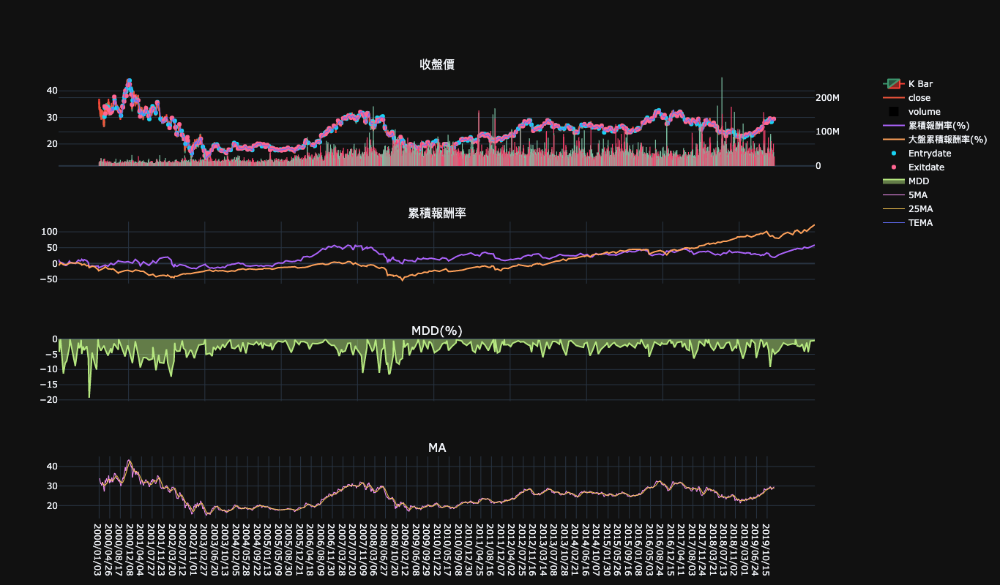

In [10]:
bt.get_plot(subplot_technical_index=['MA'], overlap=['TEMA'], sub_plot_param={'MA':[5, 25]}, overlap_param=None, log=trading_report)


# 回測策略:
  * 前一天收盤價大於5ma
  * 5MA、25MA 死叉

### 作多 + 加倉

In [31]:

class MyStrategy2(Strategy):
    
    def __init__(self):
        self.data = data
        self.tema_8 = self.indicator('TEMA', 8)['TEMA'].values
        self.tema_13 = self.indicator('TEMA', 13)['TEMA'].values

        
    def signal(self, index):

        super().signal(index)
        # Only buy the stock with empty position
        if (self.tema_8[index] > self.tema_13[index]) :
            self.long(stop_loss=0.1)
        # Only sell with long position
        if (self.tema_13[index] > self.tema_8[index]) :
            self.close()
        
        


In [32]:
%%time
bt = Backtest(MyStrategy2, initital_equity=10000, commission=0.01)
bt.run()


CPU times: user 1.19 s, sys: 6.79 ms, total: 1.19 s
Wall time: 1.2 s


In [33]:
trading_report2, yearly_report2= bt.get_report()

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/statistic.py:118: FutureWarning:

Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.



-----------------------------|
sharpe ratio | -2.111 --------|
-----------------------------|
calmar ratio | -0.033 --------|
-----------------------------|


/Users/apple/Documents/PythonProject/alphabt/alphabt/report/report.py:83: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



In [34]:
trading_report2

,Ticket,unit,action,EntryDate,EntryPrice,EntryCommission,Type,ExitDate,ExitPrice,Tax,ExitCommission,Equity,DurationDate,profit($),ROI(%),AccumulateROI(%),MDD(%),EquityReturn,EquityAccumulateReturn
0,T,1,long,2000-03-01,30.26,0.302587,normal,2000-03-10,31.39,0.0,0.313916,9802.273,9,1.13,3.734303,3.734,8.779,-1.977,-1.977
1,T,1,long,2000-03-02,32.48,0.324773,normal,2000-03-10,31.39,0.0,0.313916,9833.351,8,-1.09,-3.355911,0.253,8.779,0.317,-1.666
2,T,1,long,2000-03-03,34.37,0.343656,normal,2000-03-10,31.39,0.0,0.313916,9864.429,7,-2.98,-8.670352,-8.439,8.779,0.316,-1.356
3,T,1,long,2000-03-06,33.66,0.336575,normal,2000-03-10,31.39,0.0,0.313916,9895.507,4,-2.27,-6.743910,-14.614,4.179,0.315,-1.045
4,T,1,long,2000-03-07,32.90,0.329022,normal,2000-03-10,31.39,0.0,0.313916,9926.584,3,-1.51,-4.589666,-18.533,0.744,0.314,-0.734
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2520,T,1,long,2019-12-18,29.15,0.291541,normal,2019-12-26,29.45,0.0,0.294486,8696.042,8,0.30,1.029160,1150.692,0.485,0.336,-13.037
2521,T,1,long,2019-12-19,29.30,0.292976,normal,2019-12-26,29.45,0.0,0.294486,8725.196,7,0.15,0.511945,1157.094,0.485,0.335,-12.745
2522,T,1,long,2019-12-20,29.61,0.296148,normal,2019-12-26,29.45,0.0,0.294486,8754.350,6,-0.16,-0.540358,1150.302,0.485,0.334,-12.454
2523,T,1,long,2019-12-23,29.65,0.296450,normal,2019-12-26,29.45,0.0,0.294486,8783.504,3,-0.20,-0.674536,1141.868,0.281,0.333,-12.162


In [35]:
yearly_report2

,年度總損益(元),作多次數(次),作空次數(次),交易總次數(次),勝率(%),獲利因子,最大損失(元),最大獲利(元),個股年度報酬(%),當年度報酬率(%),平均交易報酬率(%),累積年度報酬(%),當年度權益報酬率(%),權益累積年度報酬(%),權益,年化報酬率(%),權益年化報酬率(%),大盤年化報酬率(%)
2000,-65.91,109,0,109,32.11,0.399,-7.0,3.0,-1.67,-84.33,-0.77,-84.33,-1.42,-1.42,9858,-84.33,-1.42,-9.27
2001,23.23,115,0,115,42.61,1.501,-2.0,4.0,-17.65,106.51,0.93,-67.64,-0.53,-1.94,9806,-43.11,-0.97,-11.18
2002,51.28,122,0,122,56.56,1.864,-3.0,4.0,-30.93,799.86,6.56,191.22,-0.05,-1.99,9801,42.80,-0.67,-15.44
2003,-21.98,130,0,130,33.08,0.561,-2.0,2.0,-6.56,-72.03,-0.55,-18.55,-0.70,-2.67,9732,-5.00,-0.67,-6.51
2004,-12.19,121,0,121,46.28,0.579,-2.0,2.0,-1.15,-47.03,-0.39,-56.85,-0.60,-3.26,9674,-15.47,-0.66,-3.59
2005,-6.06,109,0,109,38.53,0.666,-1.0,1.0,-5.74,-28.23,-0.26,-69.03,-0.48,-3.72,9628,-17.75,-0.63,-2.52
2006,31.57,132,0,132,50.00,2.702,-1.0,3.0,45.98,260.90,1.98,11.76,-0.28,-3.99,9601,1.60,-0.58,-0.37
2007,35.53,117,0,117,47.86,2.162,-2.0,2.0,16.51,253.33,2.17,294.89,-0.36,-4.33,9567,18.73,-0.55,0.11
2008,-26.29,126,0,126,36.51,0.626,-3.0,3.0,-31.34,-67.59,-0.54,27.98,-0.93,-5.22,9478,2.78,-0.59,-5.16
2009,-10.57,131,0,131,33.59,0.726,-1.0,2.0,-2.47,-41.95,-0.32,-25.71,-0.65,-5.84,9417,-2.93,-0.60,-2.63


/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:81: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:82: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:104: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:64: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only


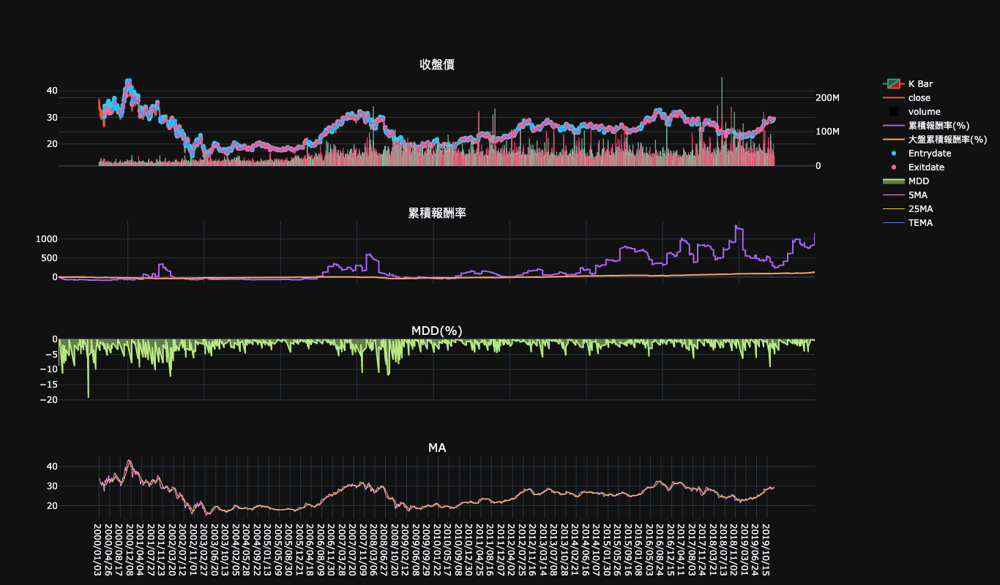

In [36]:
bt.get_plot(subplot_technical_index=['MA'], overlap=['TEMA'], sub_plot_param={'MA':[5, 25]}, overlap_param=None, log=trading_report2)


# 作多＋做空

In [21]:

class MyStrategy3(Strategy):
    
    def __init__(self):
        self.data = data
        self.tema_8 = self.indicator('TEMA', 8)['TEMA'].values
        self.tema_13 = self.indicator('TEMA', 13)['TEMA'].values

        
    def signal(self, index):

        super().signal(index)
        # Only buy the stock with empty position
        if (self.tema_8[index] > self.tema_13[index]) :
            self.long(stop_loss=0.1)
        # Only sell with long position
        if (self.tema_13[index] > self.tema_8[index]) :
            self.short(stop_loss=0.1)


In [22]:
%%time
bt = Backtest(MyStrategy3, initital_equity=10000, commission=0.01)
bt.run()


CPU times: user 1.22 s, sys: 7.37 ms, total: 1.23 s
Wall time: 1.24 s


In [23]:
data.shape

(5031, 8)

In [25]:
# res_dict = bt.get_trading_log()
# for k, v in res_dict.items():
#     print(f'{k}: {len(v)}')

In [26]:
trading_report3, yearly_report3= bt.get_report()

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/statistic.py:118: FutureWarning:

Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.



-----------------------------|
sharpe ratio | -2.514 --------|
-----------------------------|
calmar ratio | -0.065 --------|
-----------------------------|


/Users/apple/Documents/PythonProject/alphabt/alphabt/report/report.py:83: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only



In [27]:
trading_report3

,Ticket,unit,action,EntryDate,EntryPrice,EntryCommission,Type,ExitDate,ExitPrice,Tax,ExitCommission,Equity,DurationDate,profit($),ROI(%),AccumulateROI(%),MDD(%),EquityReturn,EquityAccumulateReturn
0,T,-1,short,2000-02-25,27.19,0.271903,normal,2000-03-01,30.26,0.0,0.302587,10050.895,5,3.07,10.145406,10.145,0.000,0.509,0.509
1,T,-1,short,2000-02-28,27.00,0.270015,normal,2000-03-01,30.26,0.0,0.302587,10020.334,2,3.26,10.773298,22.012,0.000,-0.304,0.203
2,T,-1,short,2000-02-29,28.09,0.280872,normal,2000-03-01,30.26,0.0,0.302587,9989.772,1,2.17,7.171183,30.761,0.000,-0.305,-0.102
3,T,1,long,2000-03-01,30.26,0.302587,normal,2000-03-10,31.39,0.0,0.313916,9792.046,9,1.13,3.734303,35.644,8.779,-1.979,-2.079
4,T,1,long,2000-03-02,32.48,0.324773,normal,2000-03-10,31.39,0.0,0.313916,9823.124,8,-1.09,-3.355911,31.092,8.779,0.317,-1.769
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4989,T,1,long,2019-12-24,29.53,0.295317,normal,2019-12-26,29.45,0.0,0.294486,7570.940,2,-0.08,-0.270911,631.104,0.000,0.387,-24.258
4990,T,-1,short,2019-12-26,29.45,0.294486,normal,2019-12-31,29.52,0.0,0.295166,7658.156,5,0.07,0.237127,632.838,0.510,1.152,-23.386
4991,T,-1,short,2019-12-27,29.64,0.296375,normal,2019-12-31,29.52,0.0,0.295166,7628.344,4,-0.12,-0.406504,629.859,0.510,-0.389,-23.684
4992,T,-1,short,2019-12-30,29.66,0.296601,normal,2019-12-31,29.52,0.0,0.295166,7598.533,1,-0.14,-0.474255,626.397,0.000,-0.391,-23.982


In [28]:
yearly_report3

,年度總損益(元),作多次數(次),作空次數(次),交易總次數(次),勝率(%),獲利因子,最大損失(元),最大獲利(元),個股年度報酬(%),當年度報酬率(%),平均交易報酬率(%),累積年度報酬(%),當年度權益報酬率(%),權益累積年度報酬(%),權益,年化報酬率(%),權益年化報酬率(%),大盤年化報酬率(%)
2000,9.94,213,0,213,53.05,1.068,-7.0,3.0,-1.67,8.19,0.04,8.19,-2.92,-2.92,9708,8.19,-2.92,-9.27
2001,-55.72,245,0,245,44.08,0.674,-6.0,4.0,-17.65,-90.25,-0.37,-89.46,-0.58,-3.48,9651,-67.53,-1.76,-11.18
2002,15.82,255,0,255,50.59,1.109,-4.0,4.0,-30.93,106.95,0.42,-78.18,-0.34,-3.81,9618,-39.80,-1.29,-15.44
2003,6.83,253,0,253,56.52,1.088,-4.0,2.0,-6.56,21.17,0.08,-73.56,-1.47,-5.23,9477,-28.29,-1.33,-6.51
2004,-5.88,251,0,251,54.18,0.865,-2.0,2.0,-1.15,-29.03,-0.12,-81.24,-1.20,-6.37,9363,-28.44,-1.31,-3.59
2005,-6.45,251,0,251,50.20,0.828,-1.0,1.0,-5.74,-33.39,-0.13,-87.50,-1.03,-7.34,9266,-29.29,-1.26,-2.52
2006,43.61,244,0,244,58.20,2.189,-1.0,3.0,45.98,522.38,2.14,-22.21,-0.94,-8.21,9178,-3.52,-1.22,-0.37
2007,62.78,253,0,253,58.50,2.409,-2.0,2.0,16.51,740.62,2.93,553.89,-1.53,-9.61,9037,26.46,-1.26,0.11
2008,-64.30,260,0,260,47.31,0.594,-4.0,4.0,-31.34,-92.68,-0.36,-52.10,-1.31,-10.80,8918,-7.85,-1.26,-5.16
2009,-4.69,248,0,248,47.58,0.922,-1.0,2.0,-2.47,-26.67,-0.11,-64.88,-1.26,-11.93,8806,-9.94,-1.26,-2.63


/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:81: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:82: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:104: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only

/Users/apple/Documents/PythonProject/alphabt/alphabt/common/plot.py:64: FutureWarning:

In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only


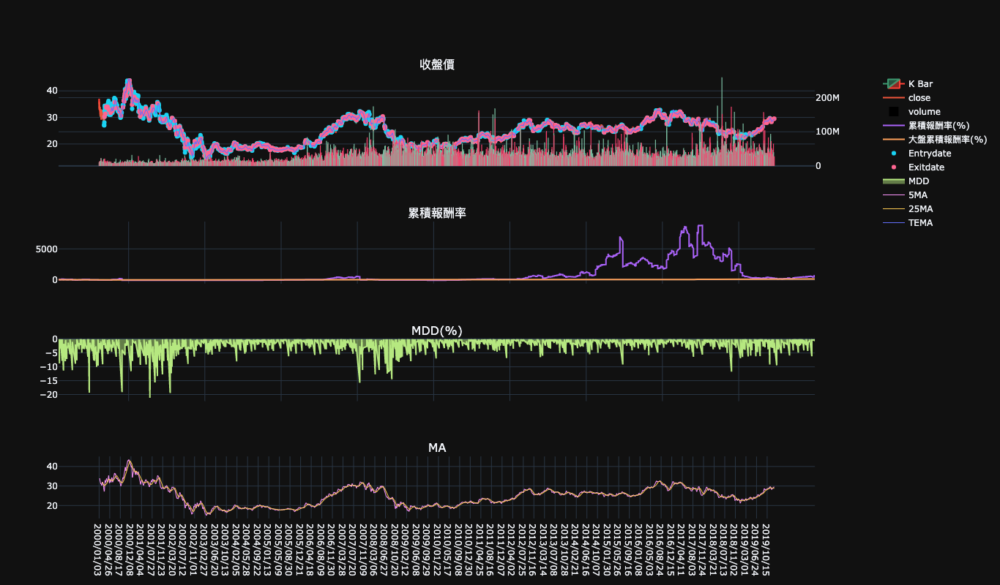

In [29]:
bt.get_plot(subplot_technical_index=['MA'], overlap=['TEMA'], sub_plot_param={'MA':[5, 25]}, overlap_param=None, log=trading_report3)
